# Exploratory Data Analysis - MultiCamFall

### Setup

In [15]:
import pandas as pd
import numpy as np
from IPython.display import display, Markdown
import matplotlib.pyplot as plt
import seaborn as sns
from summarytools import dfSummary
import cv2
import mediapipe as mp

DATA_PATH = '/Users/kai/workspace/data/MultiCamFall'
VIDEO_PATH = '/Users/kai/workspace/data/MultiCamFall/dataset/dataset'
CAM_METADATA_PATH = '../EDA/multicam_cam_metadata.csv'
CAM_METADATA_PATH_NORMALIZED = '../EDA/multicam_cam_metadata_normalized.csv'

In [2]:
df = pd.read_csv(DATA_PATH + '/data_tuple3.csv')

### Summary

In [3]:
dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,chute[float64],Mean (sd) : 12.6 (7.0)min < med < max:1.0 < 12.0 < 23.0IQR (CV) : 13.0 (1.8),23 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjAsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvlHJYcgAAAAlwSFlzAAAPYQAAD2EBqD+naQAAAq1JREFUeJzt3MGK2lAUgOGTZpSMQoIIuvMFCl249CH6sH2ELnwC38CdIBIxM8EYM4tBGEqbxHtzm5zk//ZRFz91zum9ekVRCNB139r+AEAdL21/AHSH53mvIjK2eIlrURTvTX2erwgVIvIZ6Xw+/xmG4cz0Nc7n88nzvF8uYiVUPIzDMJxtNpv3KIrSZx+O4zjYbrez4/E4FhFChVtRFKWLxeLN8PHXRj/MFwxTUIFQoQJf/WhMnucjEQk9zzN5vHRjQKhoRJIkoyzLfqxWK9/3/aeHsaqNAaGiEdfr9SUIgsl6vU6Xy+XpmWfrbAwIFY2aTqemW4PSjQHDFFQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUqPyfKcvrCc6uJmBYSkO1vZ7g8moChqXqX1Tj6wmuryZgWGodSrG4nuDsagKGhWEKKhAqVHB6HtXyaoKI0q0Bm5LmOQvV9mqCiM6tAZsSN5yFanM1QUT11oBNiQPOr6JYXE0QUbw1YFPSLIYpqECoUKHTt1Bd/qBBFYvJPbzf7yPT98XfdTZU1z9oUMZmcs+yLMjz/Huapr9FxPRvc/yhs6G6/kGDCsaT+36/n+12u8ntdvMN3hf/0NlQH1z9oEEdJpP76XRianeAYQoqECpU6PxXvynLjUFrk/tQz0dU6WWothuDtib3oZ6PqKOXodqeM2hrch/w+YhKvQz1wXRj0PbkPtTzEWUYpqACoUKFXn/1D5HF1qDTZxQItUdstgZdP6NAqD1iszXo+hkFQu0hk61B25uOKgxTUIFQoQKhQgVChQqEChUIFSoQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSoQKhQgVChAqFCBUKFCrUu98VxHDz7wpfLJRARSZIkOBwOk//5vNb31vq5bZ+v09cHuATGoW0IwUcAAAAASUVORK5CYII="">",0(0.0%)
2,cam[float64],1. 1.02. 2.03. 4.04. 5.05. 6.06. 7.07. 8.08. 3.09. 55.0,69 (12.5%)69 (12.5%)69 (12.5%)69 (12.5%)69 (12.5%)69 (12.5%)69 (12.5%)68 (12.3%)1 (0.2%),"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAADPCAYAAADifqNtAAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjAsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvlHJYcgAAAAlwSFlzAAAPYQAAD2EBqD+naQAAAv1JREFUeJzt3MFt03AchuGfo6jQS6KoUkeAHToEwzJEhmCHqqoPtHAJB45wq3krhecZ4C8fXjm15a/L5XIZKOze+wL4f4iNjNjIiI2M2MiIjYzYyCwzczszNxud9/NyubxsdBZXZn93d/flcDictjhsXdenZVm+Co6/2R8Oh9PDw8PL8Xh8fctBz8/PH8/n8+nx8fFmZsTGH/YzM8fj8fX+/v77BufdbnAGV8oDAhmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERG5n9zO/Pg9560BZncN3267o+nc/n02zwedC6rk8z8/Ptl8U18lk4mcX/+qDizkbG4IWMwQsZgxcyXuqSERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRMXghY/BCxmfhZAxeyHhAIONnlIx1FRnrKjLWVWQ8IJARGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZGxriJjXUXGZ+FkrKvIuLORMXghY/BCxuCFjJe6ZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZAxeyBi8kPFZOBmDFzLubGQMXsgYvJAxeCHjpS4ZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZGxriJjXUXGBoGMdRUZdzYy1lVkrKvIWFeR8VKXjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjMELGYMXMj4LJ2PwQsadjYzBCxmDFzIGL2S81CUjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjLWVWSsq8jYIJCxriLjzkbGuoqMdRUZ6yoyXuqSERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRMXghY/BCxmfhZAxeyHhAILNbluXzsiz+uOef283Mp5n58N4XwvXzM0pGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZHYz821mfrz3hXD9DF7I+BklIzYyYiMjNjJiIyM2MmIj8wt0XrPjWySBnAAAAABJRU5ErkJggg=="">",0(0.0%)
3,start[float64],Mean (sd) : 745.9 (613.7)min < med < max:240.0 < 606.0 < 4166.0IQR (CV) : 288.5 (1.2),351 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjAsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvlHJYcgAAAAlwSFlzAAAPYQAAD2EBqD+naQAAAmFJREFUeJzt3T2O2lAUhuFz+Ys9IANyBjqaFHQUlCxiFpstILEAeoq0CGtkhAOBOE4TokiRAF+LhA+9T825pniF7ebgiqIw4NHV/vcXAG7RuPYB51xoZi3P849FUew9Z4HfLobqnAvjOH6Loqjvc/h2u313zn0mVlR17Re1FUVRfzab7bvd7qHMwWmaBovFop8kScvMCBWVXL31m5l1u93DYDD46nF+6DED/IWXKUggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEggVEi4aaWPrzzPm2YWOed8j2AbIMzsjqFmWdY8nU6T0WhUr9frpRasnbENEGd3C/V4PDaCIHiZTqeH4XD4XnaebYD4011v/WZm7XbbdxOgGdsA8QsvU5BAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBw95U+VVTcBsgmwCfysKFW3QbIJsDn8rChVtkGmKZpMJ/PB0mSfHTObX2/ApE/jocN9cxnGyC7WZ/Pw4fqg92sz+cpQz1jN2s5zrnQzFoVjqiZ2Q/P2YuPWk8dKm7nnAvjOH6LoqjvM5/neTPLsk+dTmdVq9VOZeevPWrdFGqapkHZC+92u8DMLMuyYL1ev/zL+arXTtM0yPO8YdX+KENN1Ol0XieTyfcwDL+VHd5sNsFqtXodj8dfer3erszsfr//sFwuLz5q/QRt9uX/86Nj3AAAAABJRU5ErkJggg=="">",0(0.0%)
4,end[float64],Mean (sd) : 775.9 (613.7)min < me

### Observations

* There are 23 scenarios called `chute`
* There are 8 cameras in most chutes, and a single camera denoted camera `55`
* Each row describes a range of frames from start to end, with a single label indicating "fall" or "no fall"
* There are 264 falls included in the dataset
* And 288 ranges of video where no fall is occuring
* In terms of video segments, the dataset is well balanced between fall and no fall

In [4]:
# Calculate duration of each video segment
df['duration'] = df['end'] - df['start']

In [5]:
df['duration'].describe()

count    552.0
mean      30.0
std        0.0
min       30.0
25%       30.0
50%       30.0
75%       30.0
max       30.0
Name: duration, dtype: float64

### Observations

* The duration of every video segment is 30 frames.
* This is hard to believe, since I imagine each fall takes a variable amount of time. 

### Setup

* Next I'll check the start and end frames of each video segment for a fall and not fall example, to see what's going on.

In [6]:
def get_frames(chute, cam, start, end):
    """
    Extract a sequence of frames from a video file within the specified frame range.

    Args:
        chute (int): The chute number identifying the video scenario
        cam (int): The camera number identifying the video perspective
        start (int): The starting frame number (inclusive)
        end (int): The ending frame number (exclusive)

    Returns:
        list: A list of numpy arrays containing the video frames in BGR format
    """
    video_path = VIDEO_PATH + f"/chute{chute:02d}/cam{cam}.avi"
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    
    frame_no = 1
    frames = []

    # Read the first frame
    ret, frame = cap.read()

    # Loop over the frames
    while ret:

        if start <= frame_no < end:
            frame_timestamp_ms = int(frame_no / fps * 1000)
            frames.append((frame, frame_timestamp_ms))
        
        frame_no += 1

        # Read the next frame
        ret, frame = cap.read()

    # Release the video capture
    cap.release()

    return frames

def get_row_frames(row):
    chute = int(row['chute'])
    cam = int(row['cam'])
    start = int(row['start'])
    end = int(row['end'])
    return get_frames(chute, cam, start, end)


### No Fall

[mpeg4 @ 0x1070a6520] Error at MB: 898


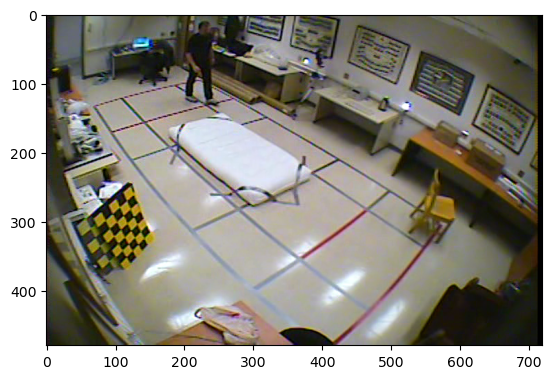

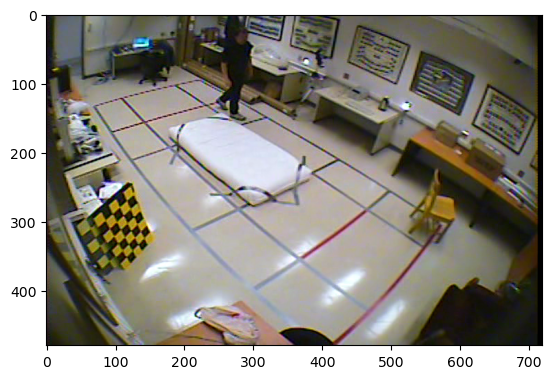

### Fall

[mpeg4 @ 0x12cdb8830] Error at MB: 898


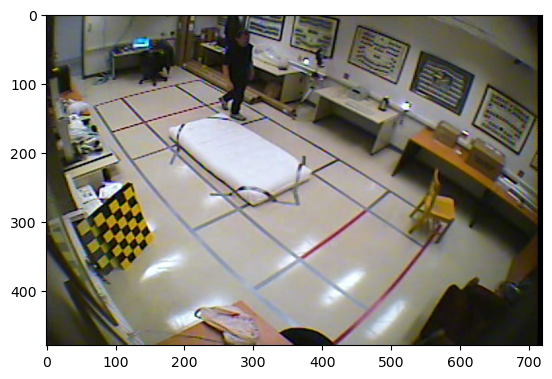

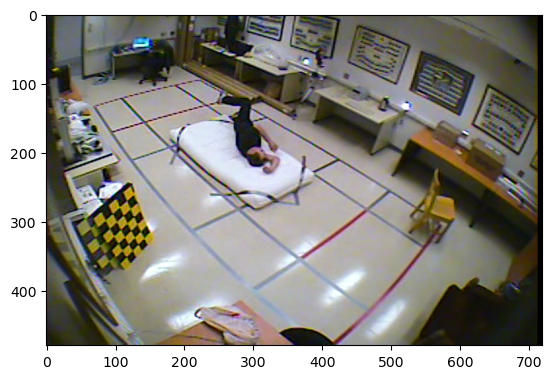

### No Fall

[mpeg4 @ 0x16e6f7c10] Error at MB: 898


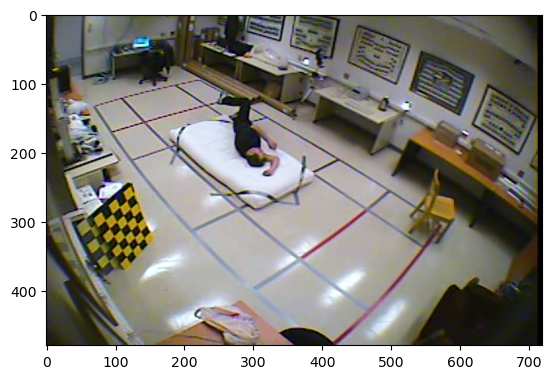

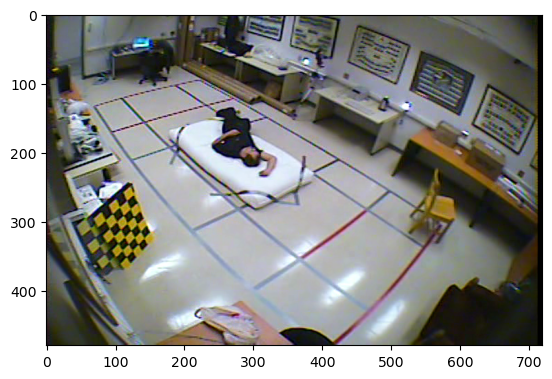

In [7]:
dfSample = df[(df['chute'] == 2.0) & (df['cam'] == 1)]

for i in range(len(dfSample)):
    row = dfSample.iloc[i]
    display(Markdown(f"### Fall" if row['label'] == 1.0 else "### No Fall"))
    frames = get_row_frames(row)

    # Display the first and last frame
    plt.imshow(cv2.cvtColor(frames[0][0], cv2.COLOR_BGR2RGB))
    plt.show()
    plt.imshow(cv2.cvtColor(frames[-1][0], cv2.COLOR_BGR2RGB))
    plt.show()


### Observations

* Okay, so indeed the frames for "fall" include the act of falling. 
* The post-fall frames are simply categorized as "no fall", which helps to distinguish between the act of falling versus the aftermath of falling, but does not help to distinguish the aftermath of falling from normal activity. 
* We could potentially re-classify the post-fall frames as a new label to classify the aftermath of falling, if it supports our use case.

In [45]:
# Get original MediaPipe landmarks from an image
def getLandmarksfromImage(image):
    # Load MediaPipe Pose model
    mp_pose = mp.solutions.pose
    pose = mp_pose.Pose()

    # Convert image to RGB (MediaPipe accepts RGB images)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Perform pose estimation
    results = pose.process(image_rgb)

    # Draw pose landmarks on the image
    if results.pose_landmarks:

        landmark_dict = {}

        for i, landmark in enumerate(results.pose_landmarks.landmark):
            landmark_name = mp_pose.PoseLandmark(i).name
            x = landmark.x
            y = landmark.y
            z = landmark.z  # Correctly assign the z value
            visibility = landmark.visibility

            # Add to landmark_dict
            landmark_dict[landmark_name] = (x, y, z, visibility)
            
    return landmark_dict

In [51]:
# Function to detect poses and draw them on the image
def detect_and_draw_pose(image, visibility_threshold=0.5):
    # Load MediaPipe Pose model
    mp_pose = mp.solutions.pose
    pose = mp_pose.Pose()

    # Convert image to RGB (MediaPipe accepts RGB images)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Perform pose estimation
    results = pose.process(image_rgb)

    # Draw pose landmarks on the image
    if results.pose_landmarks:
        mp_drawing = mp.solutions.drawing_utils
        # Plot Pose landmarks in 3D.
        mp_drawing.plot_landmarks(results.pose_world_landmarks, mp_pose.POSE_CONNECTIONS)
        annotated_image = image.copy()
        
        landmark_dict = {}

        for i, landmark in enumerate(results.pose_landmarks.landmark):
            landmark_name = mp_pose.PoseLandmark(i).name
            x = int(landmark.x * image.shape[1])
            y = int(landmark.y * image.shape[0])
            visibility = landmark.visibility

            # Add to landmark_dict
            landmark_dict[landmark_name] = (x, y, visibility)

            # Draw on image only if visibility is above the threshold
            if visibility > visibility_threshold:
                # Draw point
                cv2.circle(annotated_image, (x, y), 5, (0, 255, 0), -1)

        # Draw connections
        for connection in mp_pose.POSE_CONNECTIONS:
            start_idx = connection[0]
            end_idx = connection[1]
            if results.pose_landmarks.landmark[start_idx].visibility > visibility_threshold and results.pose_landmarks.landmark[end_idx].visibility > visibility_threshold:
                start_point = (int(results.pose_landmarks.landmark[start_idx].x * image.shape[1]), 
                               int(results.pose_landmarks.landmark[start_idx].y * image.shape[0]))
                end_point = (int(results.pose_landmarks.landmark[end_idx].x * image.shape[1]), 
                             int(results.pose_landmarks.landmark[end_idx].y * image.shape[0]))
                cv2.line(annotated_image, start_point, end_point, (0, 255, 0), 2)

        return annotated_image, landmark_dict
    else:
        return image, None

### No Fall


0: 448x640 1 person, 3 tvs, 16.2ms
Speed: 0.9ms preprocess, 16.2ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


[mpeg4 @ 0x49b865340] Error at MB: 898
I0000 00:00:1738218033.032614 120981436 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.3), renderer: Apple M3 Max
W0000 00:00:1738218033.092484 125307978 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1738218033.101004 125307978 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


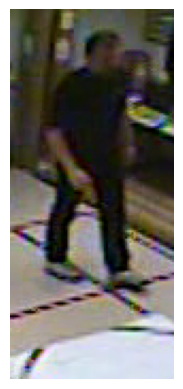


0: 448x640 1 person, 2 tvs, 17.8ms
Speed: 0.9ms preprocess, 17.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


I0000 00:00:1738218033.182183 120981436 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.3), renderer: Apple M3 Max
W0000 00:00:1738218033.242728 125307998 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1738218033.252019 125308012 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


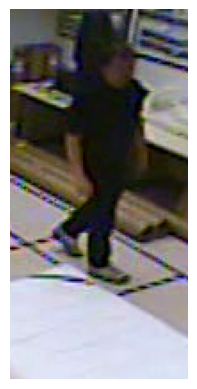

### Fall


0: 448x640 1 person, 2 tvs, 17.7ms
Speed: 0.9ms preprocess, 17.7ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


[mpeg4 @ 0x495a6f9d0] Error at MB: 898
I0000 00:00:1738218033.603179 120981436 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.3), renderer: Apple M3 Max
W0000 00:00:1738218033.664442 125308038 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1738218033.673649 125308038 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


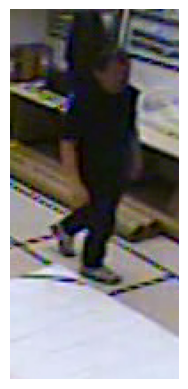


0: 448x640 4 tvs, 18.2ms
Speed: 0.8ms preprocess, 18.2ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


### No Fall


0: 448x640 1 bed, 3 tvs, 16.4ms
Speed: 1.0ms preprocess, 16.4ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 tvs, 15.2ms
Speed: 0.8ms preprocess, 15.2ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


[mpeg4 @ 0x4a2ce5310] Error at MB: 898


In [57]:
def show_annotated_image(image):
    annotated_image, pose_landmarks_dict = detect_and_draw_pose(
        image, visibility_threshold=0.6)
    plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Print pose landmarks with labels
    if pose_landmarks_dict:
        for name, (x, y, visibility) in pose_landmarks_dict.items():
            print(f'{name}: ({x}, {y}), visibility: {visibility:.2f}')

        landmarks = getLandmarksfromImage(image)
        print(landmarks)

from ultralytics import YOLO

def get_people(image):
    # Load YOLO model
    model = YOLO('yolo11x.pt')
    
    # Run inference on the image
    results = model(image)
    
    # Initialize list to store cropped person images
    cropped_people = []
    
    # Get detections for the 'person' class (class 0 in COCO)
    for r in results:
        boxes = r.boxes
        for box in boxes:
            # Check if detection is a person (class 0)
            if box.cls == 0:
                # Get coordinates with 20% padding
                x1, y1, x2, y2 = box.xyxy[0]
                width = x2 - x1
                height = y2 - y1
                padding_x = int(width * 0.4)
                padding_y = int(height * 0.4)
                
                # Add padding while keeping within image bounds
                x1 = max(0, int(x1 - padding_x))
                y1 = max(0, int(y1 - padding_y))
                x2 = min(image.shape[1], int(x2 + padding_x))
                y2 = min(image.shape[0], int(y2 + padding_y))
                
                # Crop image
                person = image[y1:y2, x1:x2]
                cropped_people.append(person)
    
    return cropped_people

for i in range(len(dfSample)):
    row = dfSample.iloc[i]
    display(Markdown(f"### Fall" if row['label'] == 1.0 else "### No Fall"))
    frames = get_row_frames(row)

    # Display the first and last frame
    people = get_people(frames[0])
    for person in people:
        show_annotated_image(person)
    people = get_people(frames[-1])
    for person in people:
        show_annotated_image(person)


### Video Landmarker

* Use the Video Landmarker model to get the landmarks of each person in the video

In [8]:
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

In [9]:
model_path = '/Users/kai/workspace/aai_530/models/pose_landmarker_heavy.task'

In [10]:
# Use OpenCV’s VideoCapture to load the input video.

# Load the frame rate of the video using OpenCV’s CV_CAP_PROP_FPS
# You’ll need it to calculate the timestamp for each frame.

# Loop through each frame in the video using VideoCapture#read()
    

In [11]:
from ultralytics import YOLO

def get_people(image):
    # Load YOLO model
    model = YOLO('yolo11x.pt')
    
    # Run inference on the image
    results = model(image)
    
    # Initialize list to store cropped person images
    cropped_people = []
    
    # Get detections for the 'person' class (class 0 in COCO)
    for r in results:
        boxes = r.boxes
        for box in boxes:
            # Check if detection is a person (class 0)
            if box.cls == 0:
                # Get coordinates with 20% padding
                x1, y1, x2, y2 = box.xyxy[0]
                width = x2 - x1
                height = y2 - y1
                padding_x = int(width * 0.4)
                padding_y = int(height * 0.4)
                
                # Add padding while keeping within image bounds
                x1 = max(0, int(x1 - padding_x))
                y1 = max(0, int(y1 - padding_y))
                x2 = min(image.shape[1], int(x2 + padding_x))
                y2 = min(image.shape[0], int(y2 + padding_y))
                
                # Crop image
                person = image[y1:y2, x1:x2]
                cropped_people.append(person)
    
    return cropped_people

In [12]:
from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import numpy as np


def draw_landmarks_on_image(rgb_image, detection_result):
  pose_landmarks_list = detection_result.pose_landmarks
  annotated_image = np.copy(rgb_image)

  # Loop through the detected poses to visualize.
  for idx in range(len(pose_landmarks_list)):
    pose_landmarks = pose_landmarks_list[idx]

    # Draw the pose landmarks.
    pose_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    pose_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in pose_landmarks
    ])
    solutions.drawing_utils.draw_landmarks(
      annotated_image,
      pose_landmarks_proto,
      solutions.pose.POSE_CONNECTIONS,
      solutions.drawing_styles.get_default_pose_landmarks_style())
  return annotated_image

In [13]:
def get_segmentation_mask(image, model):
    """Get segmentation mask for people in the image using YOLOv8 segmentation model.
    
    Args:
        image: Input image
        model: YOLOv8 segmentation model
        
    Returns:
        Binary mask where 1 indicates person pixels and 0 indicates background
    """
    # Run segmentation
    results = model(image, conf=0.3)[0]
    
    # Initialize empty mask
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    
    # For each detected person
    if results.masks:
        for seg in results.masks:
            # Get segmentation mask
            person_mask = seg.data[0].numpy()
        
            # Resize mask to match image dimensions
            person_mask = cv2.resize(person_mask, (image.shape[1], image.shape[0]))
            
            # Add to overall mask
            mask = np.logical_or(mask, person_mask).astype(np.uint8)
        
    return mask


In [28]:
import cv2
from ultralytics import YOLO

def process_frame(frame):
    model = YOLO('yolo11x-seg.pt')
    segmentation_mask = get_segmentation_mask(frame, model)

    # Apply blur to background using the mask
    blurred_background = cv2.GaussianBlur(frame, (0, 0), 15)  

    # Blend the blurred background with foreground using the mask
    mask = segmentation_mask[..., np.newaxis]  # Add channel dimension to match image
    result = frame * mask + blurred_background * (1 - mask)  # Blend based on mask values
    # Normalize the result to be between 0 and 1
    return result 

I0000 00:00:1738460804.301190 126022464 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.3), renderer: Apple M3 Max
W0000 00:00:1738460804.368841 127840975 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1738460804.395215 127840976 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


### No Fall

[mpeg4 @ 0x397097460] Error at MB: 898



0: 448x640 1 person, 1 bed, 158.9ms
Speed: 1.1ms preprocess, 158.9ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 156.8ms
Speed: 0.6ms preprocess, 156.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3075

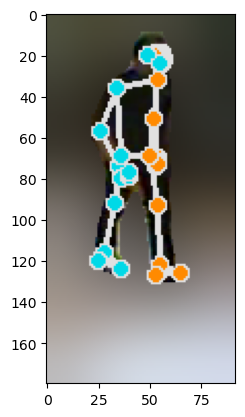


0: 448x640 1 person, 2 chairs, 1 bed, 1 dining table, 139.0ms
Speed: 0.9ms preprocess, 139.0ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x320 1 person, 134.8ms
Speed: 0.6ms preprocess, 134.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 320)


#### Frame Timestamp: 3083

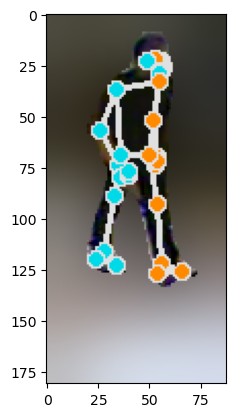


0: 448x640 1 person, 1 bed, 1 dining table, 249.6ms
Speed: 0.9ms preprocess, 249.6ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 175.9ms
Speed: 0.7ms preprocess, 175.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3091

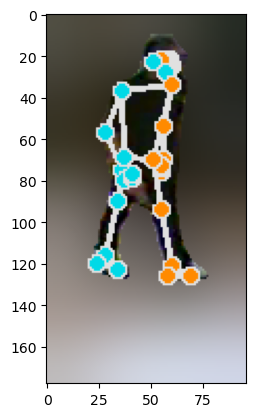


0: 448x640 1 person, 1 bed, 1 tv, 162.7ms
Speed: 1.2ms preprocess, 162.7ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 1 person, 1 suitcase, 317.0ms
Speed: 1.1ms preprocess, 317.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


#### Frame Timestamp: 3100

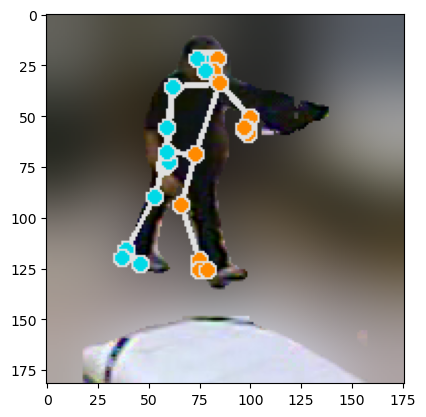


0: 448x640 1 person, 1 bed, 2 tvs, 147.6ms
Speed: 1.0ms preprocess, 147.6ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 1 person, 304.9ms
Speed: 1.0ms preprocess, 304.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


#### Frame Timestamp: 3108

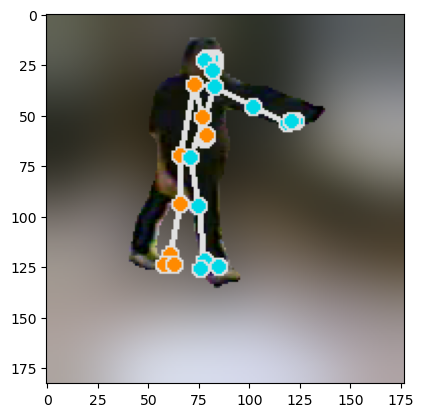


0: 448x640 1 person, 1 bed, 1 dining table, 1 tv, 182.0ms
Speed: 1.2ms preprocess, 182.0ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x416 1 person, 205.9ms
Speed: 0.9ms preprocess, 205.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 416)


#### Frame Timestamp: 3116

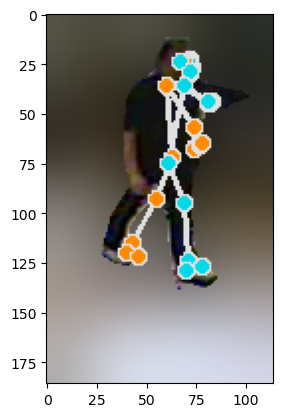


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 152.8ms
Speed: 0.9ms preprocess, 152.8ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x384 1 person, 179.1ms
Speed: 0.7ms preprocess, 179.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)


#### Frame Timestamp: 3125

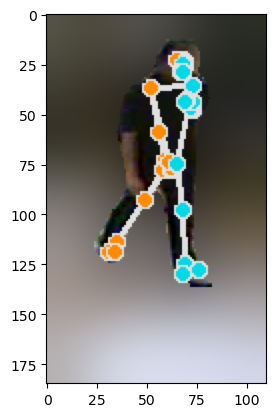


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 145.4ms
Speed: 1.0ms preprocess, 145.4ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 3 persons, 1 suitcase, 240.0ms
Speed: 0.9ms preprocess, 240.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3133

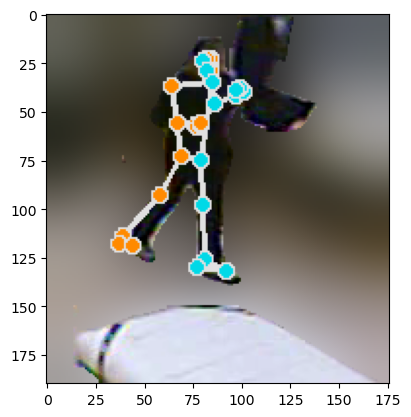


0: 448x640 1 person, 1 skateboard, 2 chairs, 1 bed, 1 dining table, 2 tvs, 174.1ms
Speed: 1.0ms preprocess, 174.1ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 2 persons, 1 skateboard, 299.9ms
Speed: 1.0ms preprocess, 299.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3141

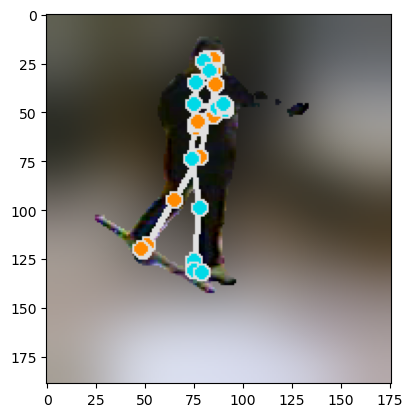


0: 448x640 1 person, 1 skateboard, 1 bed, 3 tvs, 164.6ms
Speed: 0.8ms preprocess, 164.6ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x576 1 person, 1 skateboard, 258.6ms
Speed: 0.8ms preprocess, 258.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 576)


#### Frame Timestamp: 3150

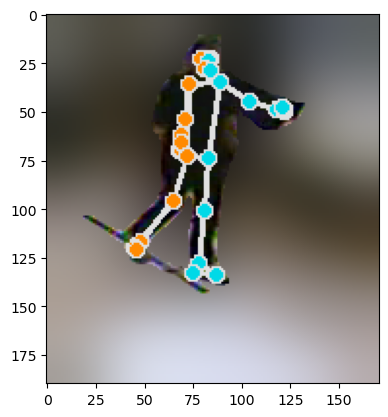


0: 448x640 1 person, 1 bed, 2 tvs, 153.5ms
Speed: 0.9ms preprocess, 153.5ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x576 1 person, 246.6ms
Speed: 1.3ms preprocess, 246.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 576)


#### Frame Timestamp: 3158

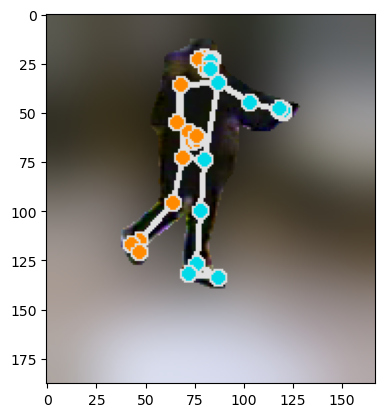


0: 448x640 1 person, 2 chairs, 1 bed, 1 dining table, 2 tvs, 167.6ms
Speed: 0.9ms preprocess, 167.6ms inference, 0.7ms postprocess per image at shape (1, 3, 448, 640)

0: 640x544 1 person, 265.1ms
Speed: 1.0ms preprocess, 265.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 544)


#### Frame Timestamp: 3166

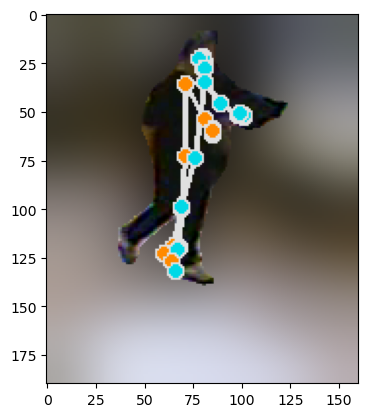


0: 448x640 1 person, 1 chair, 1 bed, 1 dining table, 2 tvs, 175.5ms
Speed: 0.9ms preprocess, 175.5ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x544 1 person, 253.6ms
Speed: 0.9ms preprocess, 253.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 544)


#### Frame Timestamp: 3175

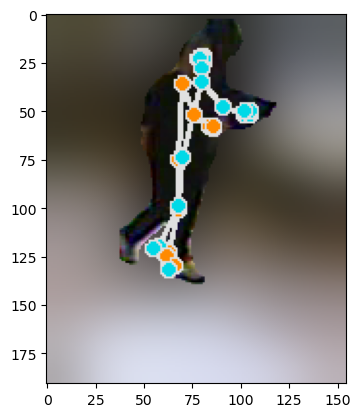


0: 448x640 1 person, 1 chair, 1 bed, 2 tvs, 151.9ms
Speed: 0.9ms preprocess, 151.9ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x512 1 person, 269.5ms
Speed: 1.0ms preprocess, 269.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 512)


#### Frame Timestamp: 3183

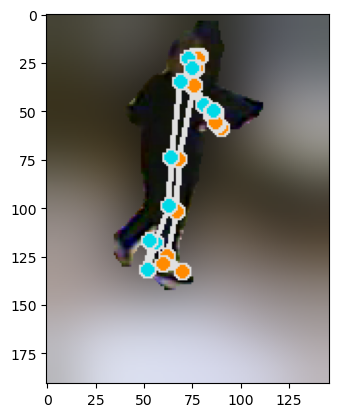


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 165.5ms
Speed: 1.0ms preprocess, 165.5ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x480 1 person, 234.7ms
Speed: 0.8ms preprocess, 234.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)


#### Frame Timestamp: 3191

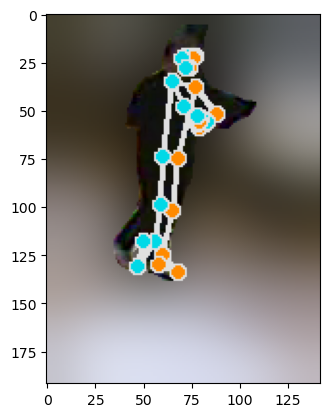


0: 448x640 1 person, 1 chair, 1 bed, 2 tvs, 158.0ms
Speed: 1.0ms preprocess, 158.0ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x448 1 person, 233.4ms
Speed: 0.8ms preprocess, 233.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 448)


#### Frame Timestamp: 3200

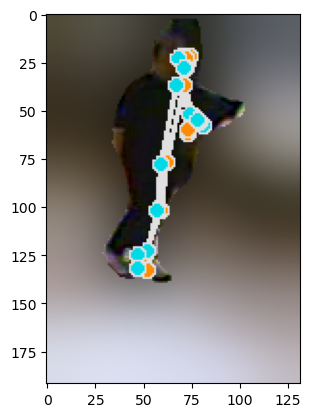


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 159.6ms
Speed: 0.9ms preprocess, 159.6ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x416 1 person, 180.4ms
Speed: 0.7ms preprocess, 180.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 416)


#### Frame Timestamp: 3208

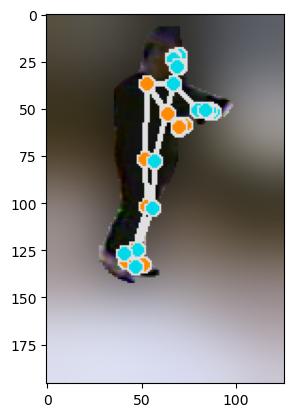


0: 448x640 1 person, 1 bed, 1 dining table, 1 tv, 188.5ms
Speed: 0.9ms preprocess, 188.5ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)

0: 640x416 1 person, 211.1ms
Speed: 0.8ms preprocess, 211.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 416)


#### Frame Timestamp: 3216

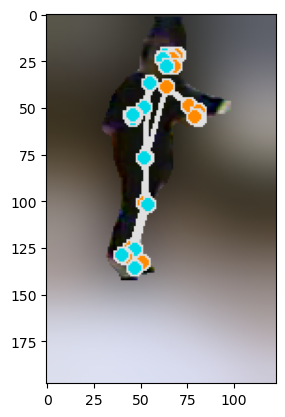


0: 448x640 1 person, 1 bed, 2 tvs, 243.8ms
Speed: 1.0ms preprocess, 243.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x384 1 person, 187.5ms
Speed: 0.8ms preprocess, 187.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


#### Frame Timestamp: 3225

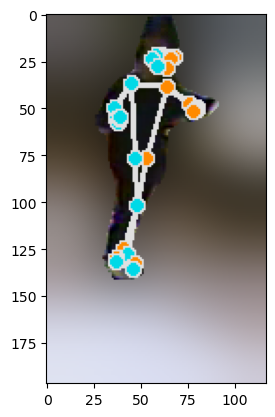


0: 448x640 1 person, 1 bed, 2 tvs, 141.4ms
Speed: 0.9ms preprocess, 141.4ms inference, 0.6ms postprocess per image at shape (1, 3, 448, 640)

0: 640x384 1 person, 1 bed, 207.5ms
Speed: 0.6ms preprocess, 207.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 384)


#### Frame Timestamp: 3233

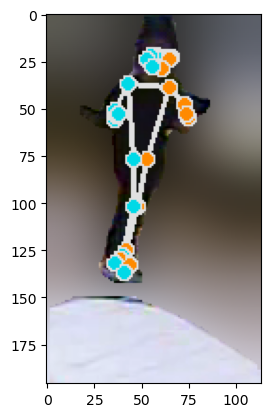


0: 448x640 1 person, 1 bed, 1 tv, 177.2ms
Speed: 1.0ms preprocess, 177.2ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)

0: 640x384 1 person, 182.9ms
Speed: 0.8ms preprocess, 182.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


#### Frame Timestamp: 3241

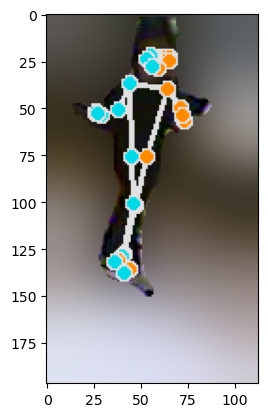


0: 448x640 1 person, 1 chair, 1 bed, 1 dining table, 1 tv, 146.7ms
Speed: 1.1ms preprocess, 146.7ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 163.3ms
Speed: 0.6ms preprocess, 163.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3250

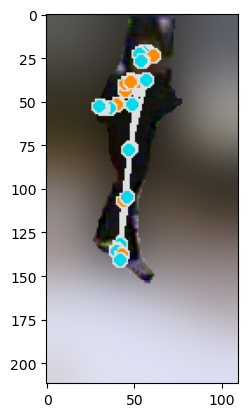


0: 448x640 1 person, 1 bed, 1 tv, 145.8ms
Speed: 0.8ms preprocess, 145.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 156.0ms
Speed: 0.6ms preprocess, 156.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3258

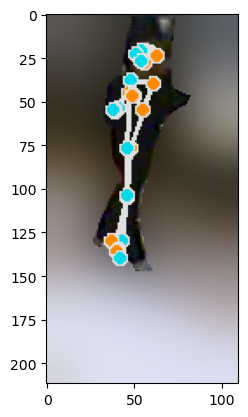


0: 448x640 1 person, 1 bed, 1 dining table, 189.1ms
Speed: 1.0ms preprocess, 189.1ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 189.8ms
Speed: 0.7ms preprocess, 189.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3266

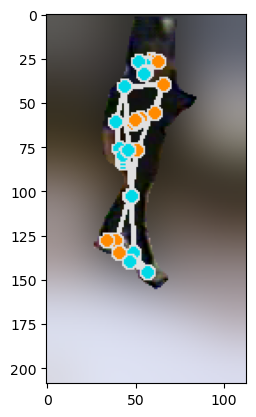


0: 448x640 1 person, 1 bed, 1 tv, 172.8ms
Speed: 1.0ms preprocess, 172.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 1 skis, 180.6ms
Speed: 0.7ms preprocess, 180.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3275

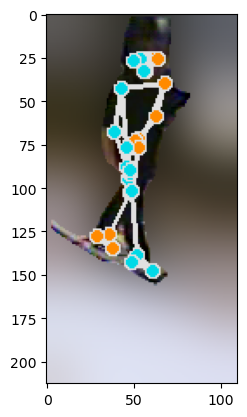


0: 448x640 1 person, 1 bed, 1 dining table, 1 tv, 171.7ms
Speed: 1.2ms preprocess, 171.7ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 153.3ms
Speed: 0.7ms preprocess, 153.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3283

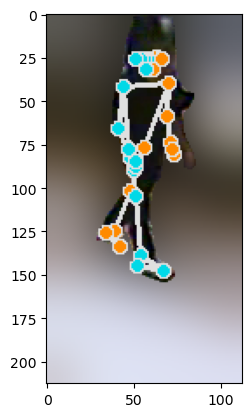


0: 448x640 1 person, 1 chair, 1 bed, 2 tvs, 150.0ms
Speed: 0.9ms preprocess, 150.0ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 178.0ms
Speed: 0.7ms preprocess, 178.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3291

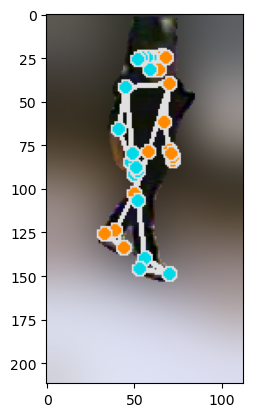


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 174.4ms
Speed: 1.0ms preprocess, 174.4ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 167.9ms
Speed: 0.7ms preprocess, 167.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3300

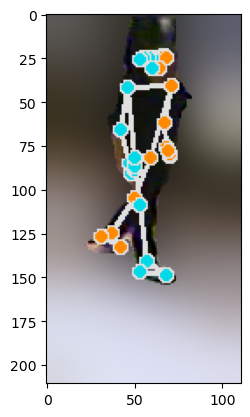


0: 448x640 1 person, 1 bed, 1 dining table, 1 tv, 160.1ms
Speed: 1.1ms preprocess, 160.1ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x320 1 person, 145.7ms
Speed: 1.8ms preprocess, 145.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 320)


#### Frame Timestamp: 3308

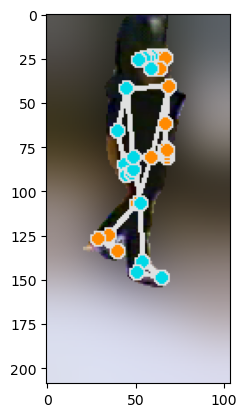


0: 448x640 1 person, 1 bed, 1 dining table, 1 tv, 159.7ms
Speed: 0.8ms preprocess, 159.7ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 187.5ms
Speed: 0.8ms preprocess, 187.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3316

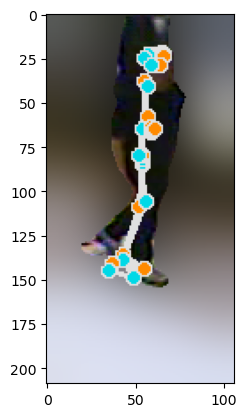

### Fall

[mpeg4 @ 0x104eff200] Error at MB: 898



0: 448x640 1 person, 2 chairs, 1 bed, 1 dining table, 2 tvs, 169.2ms
Speed: 1.0ms preprocess, 169.2ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x320 1 person, 1 snowboard, 144.9ms
Speed: 0.6ms preprocess, 144.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 320)


#### Frame Timestamp: 3333

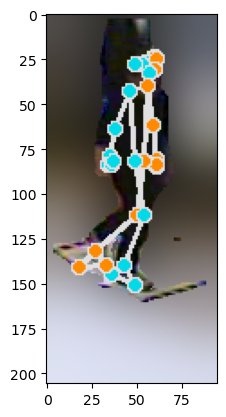


0: 448x640 1 person, 1 chair, 1 bed, 177.3ms
Speed: 1.0ms preprocess, 177.3ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

0: 640x288 1 person, 1 snowboard, 155.3ms
Speed: 0.7ms preprocess, 155.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 288)


#### Frame Timestamp: 3341

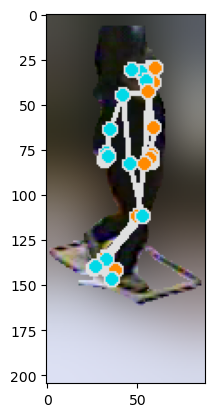


0: 448x640 1 person, 1 chair, 1 bed, 1 dining table, 2 tvs, 147.6ms
Speed: 1.0ms preprocess, 147.6ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x288 1 person, 1 snowboard, 152.3ms
Speed: 0.7ms preprocess, 152.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 288)


#### Frame Timestamp: 3350

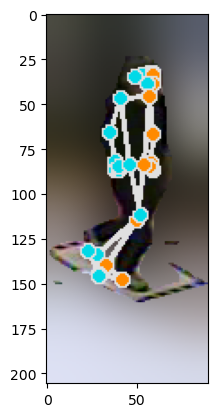


0: 448x640 1 person, 1 chair, 1 bed, 1 dining table, 1 tv, 162.3ms
Speed: 2.2ms preprocess, 162.3ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x288 1 person, 179.0ms
Speed: 0.6ms preprocess, 179.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)


#### Frame Timestamp: 3358

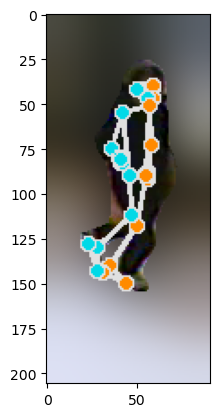


0: 448x640 1 person, 1 bed, 2 tvs, 247.1ms
Speed: 0.9ms preprocess, 247.1ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x288 1 person, 2 snowboards, 155.3ms
Speed: 0.6ms preprocess, 155.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 288)


#### Frame Timestamp: 3366

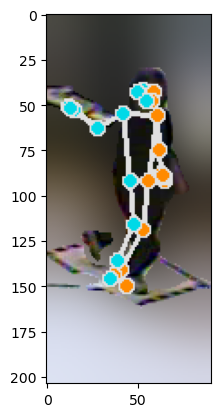


0: 448x640 2 persons, 1 chair, 1 bed, 1 tv, 150.6ms
Speed: 1.1ms preprocess, 150.6ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x256 1 person, 122.6ms
Speed: 0.5ms preprocess, 122.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 256)


#### Frame Timestamp: 3375

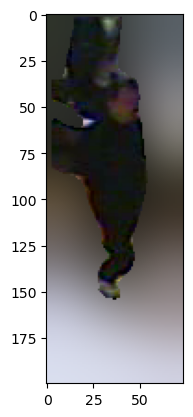


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 175.8ms
Speed: 0.9ms preprocess, 175.8ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x256 2 persons, 130.0ms
Speed: 0.8ms preprocess, 130.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 256)


#### Frame Timestamp: 3383

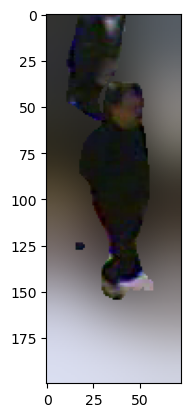


0: 448x640 1 person, 1 bed, 1 tv, 181.3ms
Speed: 0.9ms preprocess, 181.3ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x320 1 person, 158.7ms
Speed: 0.6ms preprocess, 158.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 320)


#### Frame Timestamp: 3391

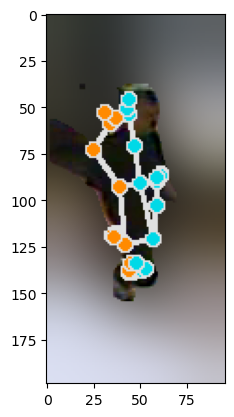


0: 448x640 1 person, 1 bed, 145.7ms
Speed: 0.9ms preprocess, 145.7ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x320 2 persons, 144.4ms
Speed: 0.6ms preprocess, 144.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 320)


#### Frame Timestamp: 3400

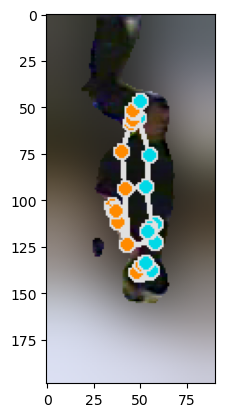


0: 448x640 1 bed, 1 tv, 168.4ms
Speed: 1.0ms preprocess, 168.4ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 person, 1 chair, 1 bed, 2 tvs, 184.8ms
Speed: 1.0ms preprocess, 184.8ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)

0: 640x320 1 person, 170.3ms
Speed: 0.9ms preprocess, 170.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 320)


#### Frame Timestamp: 3416

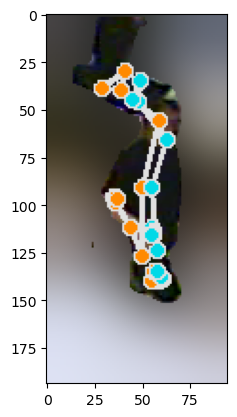


0: 448x640 1 person, 1 bed, 1 tv, 157.4ms
Speed: 0.9ms preprocess, 157.4ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x352 1 person, 168.9ms
Speed: 0.9ms preprocess, 168.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 352)


#### Frame Timestamp: 3425

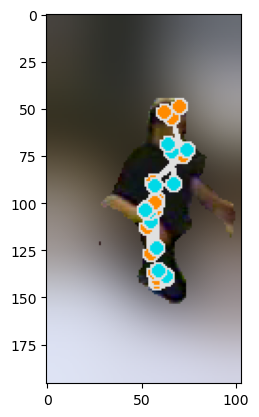


0: 448x640 1 person, 1 chair, 1 bed, 1 dining table, 153.5ms
Speed: 1.0ms preprocess, 153.5ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x384 1 person, 231.0ms
Speed: 0.8ms preprocess, 231.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 384)


#### Frame Timestamp: 3433

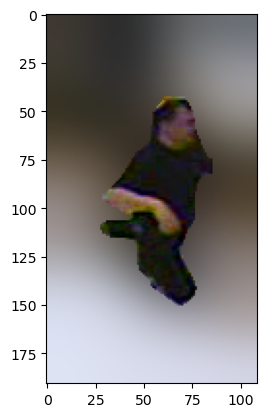


0: 448x640 1 person, 2 chairs, 1 bed, 1 tv, 177.8ms
Speed: 1.1ms preprocess, 177.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x416 1 person, 203.0ms
Speed: 0.8ms preprocess, 203.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 416)


#### Frame Timestamp: 3441

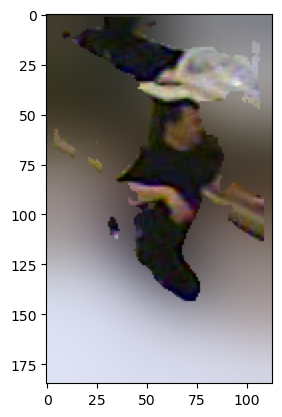


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 1 keyboard, 186.5ms
Speed: 1.6ms preprocess, 186.5ms inference, 0.7ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 (no detections), 276.6ms
Speed: 0.9ms preprocess, 276.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


#### Frame Timestamp: 3450

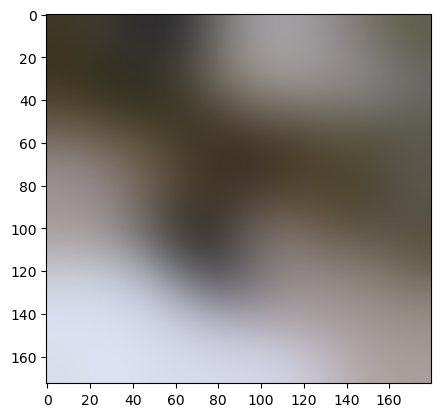


0: 448x640 1 person, 1 chair, 1 bed, 3 tvs, 1 keyboard, 145.4ms
Speed: 0.9ms preprocess, 145.4ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 544x640 1 person, 1 bench, 233.8ms
Speed: 0.8ms preprocess, 233.8ms inference, 1.4ms postprocess per image at shape (1, 3, 544, 640)


#### Frame Timestamp: 3458

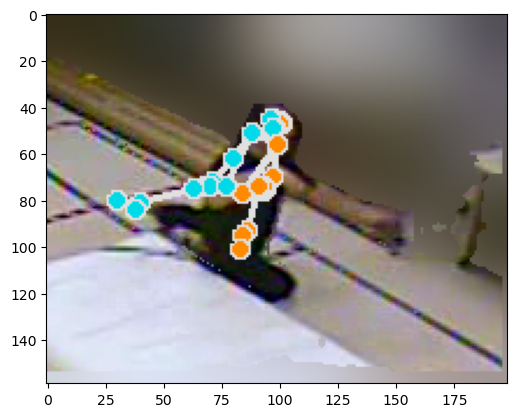


0: 448x640 1 person, 1 bed, 218.7ms
Speed: 1.0ms preprocess, 218.7ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 1 cat, 1 bed, 208.2ms
Speed: 0.7ms preprocess, 208.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


#### Frame Timestamp: 3466

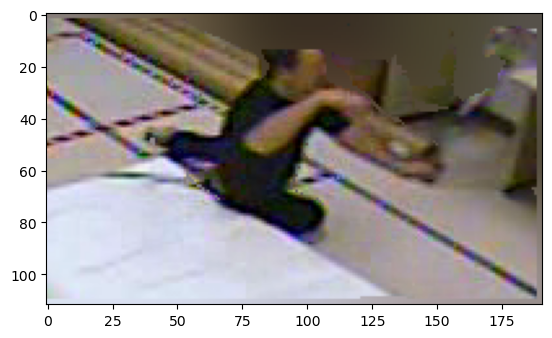


0: 448x640 1 chair, 1 bed, 1 tv, 161.9ms
Speed: 0.9ms preprocess, 161.9ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 dog, 1 chair, 1 bed, 141.9ms
Speed: 0.9ms preprocess, 141.9ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 chair, 1 bed, 1 tv, 165.3ms
Speed: 0.9ms preprocess, 165.3ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 cat, 1 bed, 2 tvs, 2 keyboards, 158.5ms
Speed: 1.0ms preprocess, 158.5ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 person, 2 chairs, 1 bed, 196.7ms
Speed: 0.9ms preprocess, 196.7ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 576x640 1 cat, 1 suitcase, 288.1ms
Speed: 0.9ms preprocess, 288.1ms inference, 0.7ms postprocess per image at shape (1, 3, 576, 640)


#### Frame Timestamp: 3508

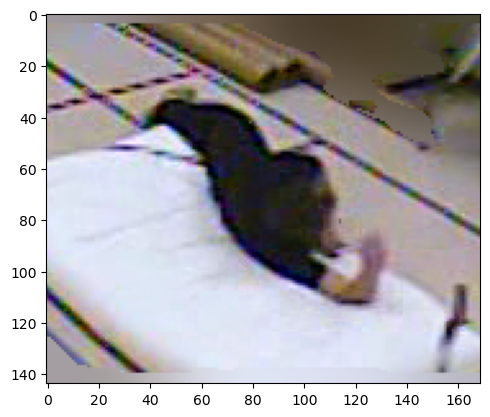


0: 448x640 1 cat, 2 chairs, 1 bed, 161.0ms
Speed: 1.0ms preprocess, 161.0ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 person, 3 chairs, 1 bed, 1 tv, 1 keyboard, 164.8ms
Speed: 1.0ms preprocess, 164.8ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x512 1 cat, 246.5ms
Speed: 1.0ms preprocess, 246.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 512)


#### Frame Timestamp: 3525

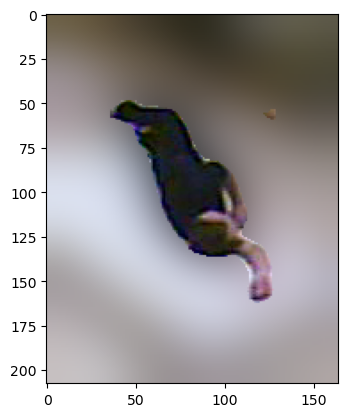


0: 448x640 2 chairs, 1 bed, 1 tv, 148.8ms
Speed: 1.0ms preprocess, 148.8ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 person, 2 chairs, 1 bed, 1 keyboard, 168.6ms
Speed: 0.9ms preprocess, 168.6ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x544 1 dog, 281.4ms
Speed: 0.8ms preprocess, 281.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 544)


#### Frame Timestamp: 3541

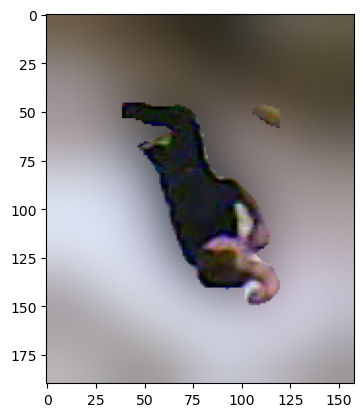


0: 448x640 1 cat, 1 chair, 1 bed, 1 keyboard, 180.4ms
Speed: 1.0ms preprocess, 180.4ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 cat, 2 chairs, 1 bed, 175.3ms
Speed: 0.9ms preprocess, 175.3ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 person, 1 dog, 2 chairs, 1 bed, 1 tv, 159.0ms
Speed: 1.0ms preprocess, 159.0ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x544 1 cat, 230.2ms
Speed: 0.7ms preprocess, 230.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 544)


#### Frame Timestamp: 3566

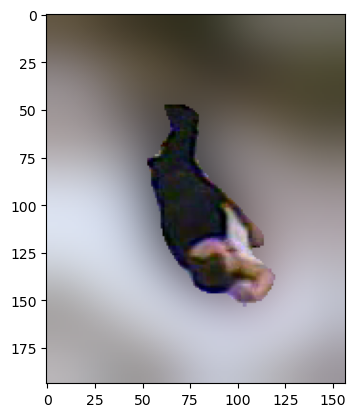


0: 448x640 1 person, 1 cat, 1 chair, 1 bed, 159.3ms
Speed: 0.9ms preprocess, 159.3ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x480 1 cat, 225.0ms
Speed: 0.8ms preprocess, 225.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)


#### Frame Timestamp: 3575

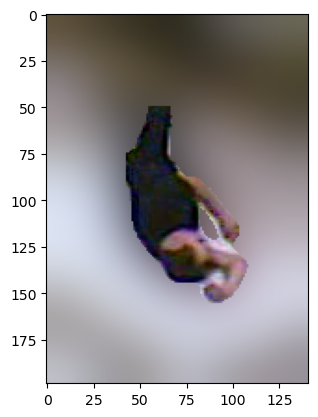

### No Fall

[mpeg4 @ 0x3970bcdf0] Error at MB: 898



0: 448x640 1 person, 1 cat, 2 chairs, 1 bed, 211.6ms
Speed: 1.1ms preprocess, 211.6ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x480 1 cat, 245.5ms
Speed: 0.8ms preprocess, 245.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


#### Frame Timestamp: 3583

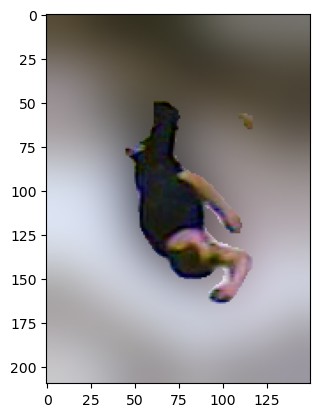


0: 448x640 1 person, 1 cat, 2 chairs, 1 bed, 1 tv, 179.3ms
Speed: 0.9ms preprocess, 179.3ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x480 1 cat, 232.3ms
Speed: 0.9ms preprocess, 232.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)


#### Frame Timestamp: 3591

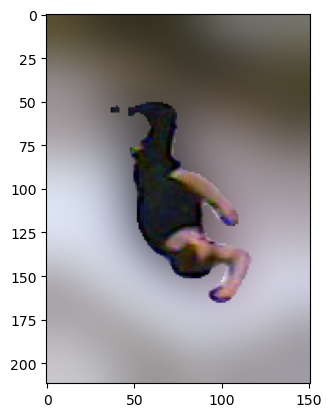


0: 448x640 1 person, 2 chairs, 1 bed, 1 tv, 157.1ms
Speed: 0.8ms preprocess, 157.1ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x544 1 person, 1 bed, 227.0ms
Speed: 0.7ms preprocess, 227.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 544)


#### Frame Timestamp: 3600

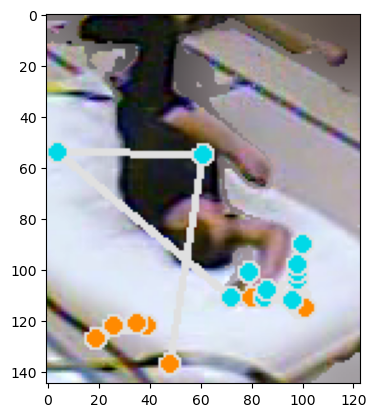


0: 448x640 1 person, 2 chairs, 1 bed, 1 tv, 191.6ms
Speed: 1.0ms preprocess, 191.6ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x480 1 cat, 1 bed, 259.2ms
Speed: 0.9ms preprocess, 259.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


#### Frame Timestamp: 3608

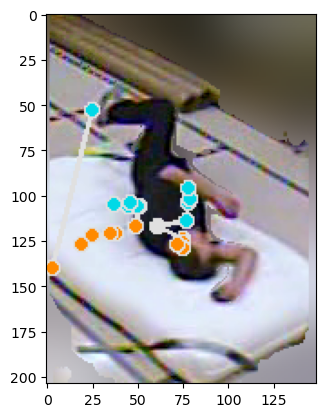


0: 448x640 1 person, 2 chairs, 1 bed, 1 tv, 174.6ms
Speed: 0.9ms preprocess, 174.6ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x512 1 person, 244.0ms
Speed: 0.8ms preprocess, 244.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 512)


#### Frame Timestamp: 3616

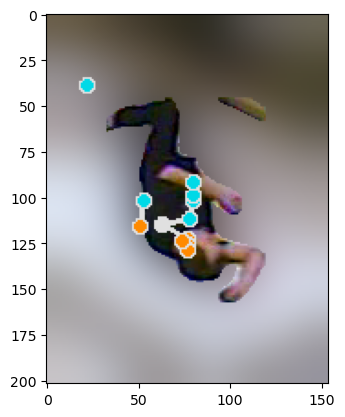


0: 448x640 1 person, 2 chairs, 1 bed, 1 tv, 1 keyboard, 1 teddy bear, 177.8ms
Speed: 1.0ms preprocess, 177.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x512 1 person, 1 bench, 227.9ms
Speed: 1.1ms preprocess, 227.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 512)


#### Frame Timestamp: 3625

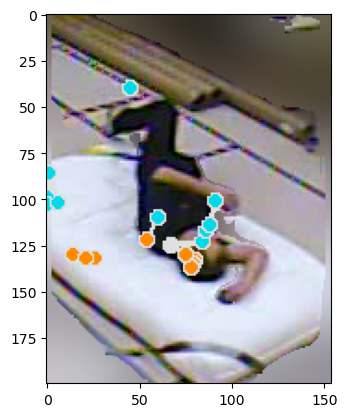


0: 448x640 1 person, 1 bed, 2 tvs, 189.4ms
Speed: 1.0ms preprocess, 189.4ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)

0: 640x512 1 person, 1 dog, 271.0ms
Speed: 0.9ms preprocess, 271.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)


#### Frame Timestamp: 3633

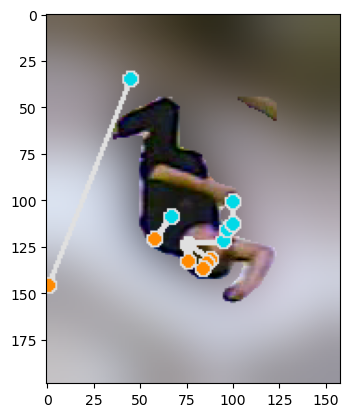


0: 448x640 1 person, 2 chairs, 1 bed, 2 tvs, 1 teddy bear, 172.6ms
Speed: 1.0ms preprocess, 172.6ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)

0: 640x512 1 person, 1 suitcase, 244.3ms
Speed: 0.8ms preprocess, 244.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 512)


#### Frame Timestamp: 3641

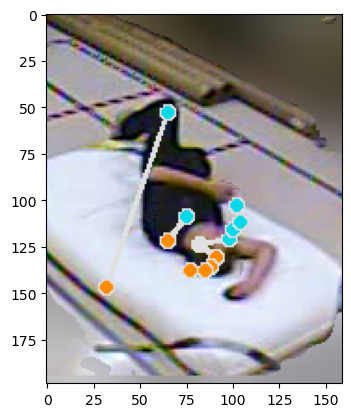


0: 448x640 1 person, 2 chairs, 1 bed, 1 keyboard, 1 teddy bear, 162.1ms
Speed: 0.8ms preprocess, 162.1ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x544 1 bench, 1 dog, 1 suitcase, 234.5ms
Speed: 0.9ms preprocess, 234.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 544)


#### Frame Timestamp: 3650

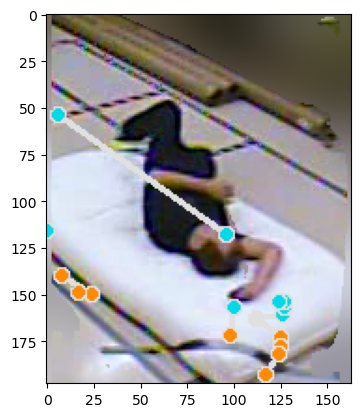


0: 448x640 1 person, 2 chairs, 1 bed, 2 tvs, 1 teddy bear, 174.9ms
Speed: 0.9ms preprocess, 174.9ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x544 1 dog, 1 suitcase, 263.1ms
Speed: 1.9ms preprocess, 263.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 544)


#### Frame Timestamp: 3658

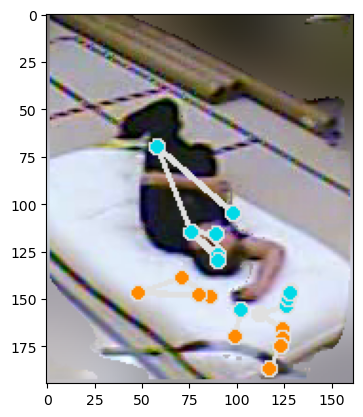


0: 448x640 1 person, 3 chairs, 1 bed, 3 tvs, 182.3ms
Speed: 1.0ms preprocess, 182.3ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x544 1 person, 1 suitcase, 237.7ms
Speed: 0.9ms preprocess, 237.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 544)


#### Frame Timestamp: 3666

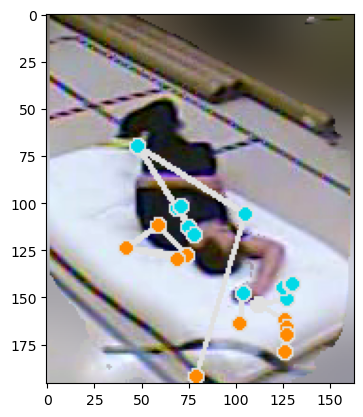


0: 448x640 1 chair, 1 bed, 1 tv, 1 teddy bear, 148.8ms
Speed: 1.0ms preprocess, 148.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 2 chairs, 1 bed, 1 tv, 1 teddy bear, 142.7ms
Speed: 1.0ms preprocess, 142.7ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 2 chairs, 1 bed, 1 tv, 1 teddy bear, 146.8ms
Speed: 2.4ms preprocess, 146.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)


#### No people detected


0: 448x640 1 person, 2 chairs, 1 bed, 1 teddy bear, 201.0ms
Speed: 0.9ms preprocess, 201.0ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x544 1 person, 263.5ms
Speed: 0.7ms preprocess, 263.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 544)


#### Frame Timestamp: 3700

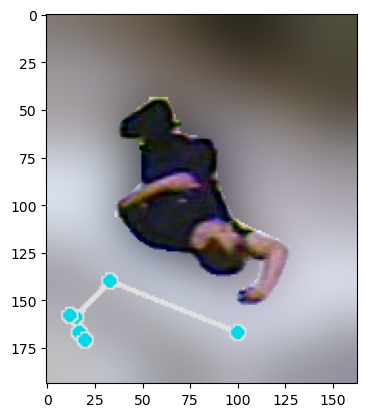


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 1 keyboard, 1 teddy bear, 171.4ms
Speed: 1.0ms preprocess, 171.4ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x576 1 laptop, 253.1ms
Speed: 0.9ms preprocess, 253.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 576)


#### Frame Timestamp: 3708

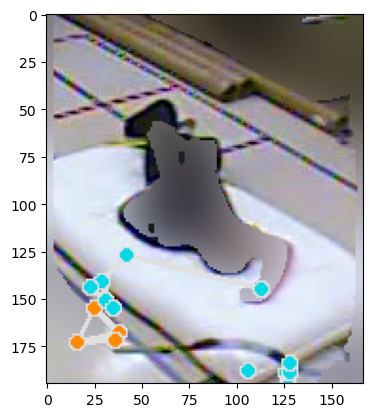


0: 448x640 1 person, 2 chairs, 1 bed, 1 teddy bear, 158.9ms
Speed: 1.2ms preprocess, 158.9ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x576 1 person, 1 laptop, 248.2ms
Speed: 0.9ms preprocess, 248.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 576)


#### Frame Timestamp: 3716

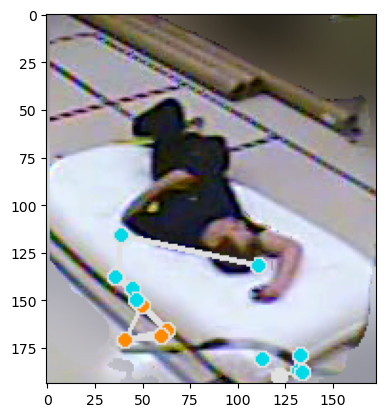


0: 448x640 1 person, 2 chairs, 1 bed, 211.4ms
Speed: 2.5ms preprocess, 211.4ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x576 1 dog, 1 laptop, 296.7ms
Speed: 0.9ms preprocess, 296.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 576)


#### Frame Timestamp: 3725

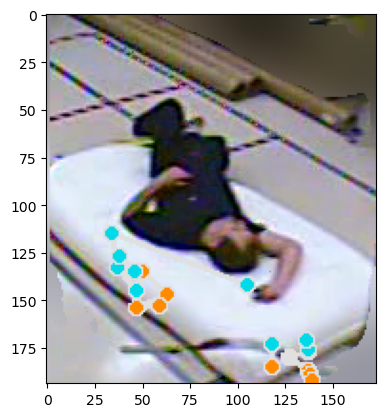


0: 448x640 1 person, 2 chairs, 1 bed, 1 tv, 1 teddy bear, 210.1ms
Speed: 0.9ms preprocess, 210.1ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 1 dog, 1 laptop, 282.5ms
Speed: 0.9ms preprocess, 282.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3733

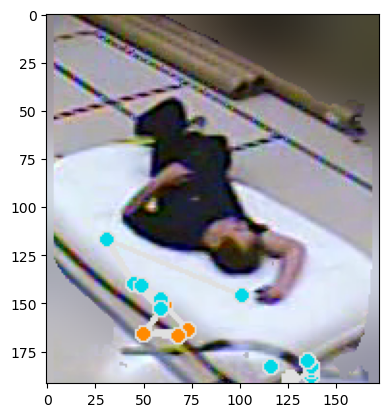


0: 448x640 1 person, 2 chairs, 1 bed, 1 tv, 1 teddy bear, 146.8ms
Speed: 0.9ms preprocess, 146.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x576 1 person, 1 cat, 227.1ms
Speed: 1.0ms preprocess, 227.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 576)


#### Frame Timestamp: 3741

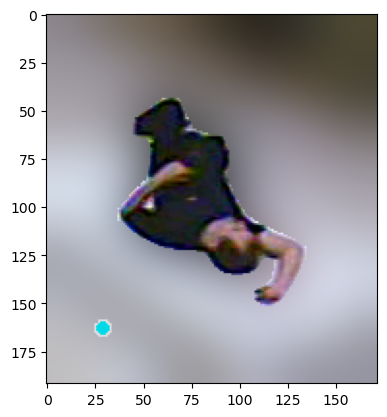


0: 448x640 1 person, 2 chairs, 1 bed, 192.7ms
Speed: 1.0ms preprocess, 192.7ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x576 1 person, 280.9ms
Speed: 1.0ms preprocess, 280.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 576)


#### Frame Timestamp: 3750

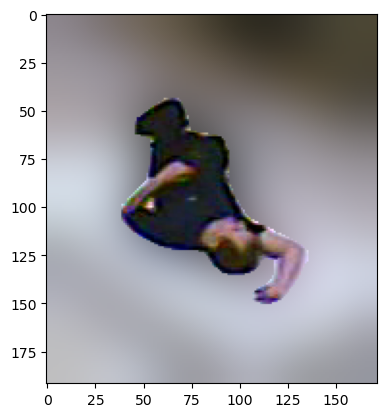


0: 448x640 1 person, 2 chairs, 1 bed, 2 tvs, 1 teddy bear, 166.1ms
Speed: 0.9ms preprocess, 166.1ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x576 1 person, 269.6ms
Speed: 1.0ms preprocess, 269.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 576)


#### Frame Timestamp: 3758

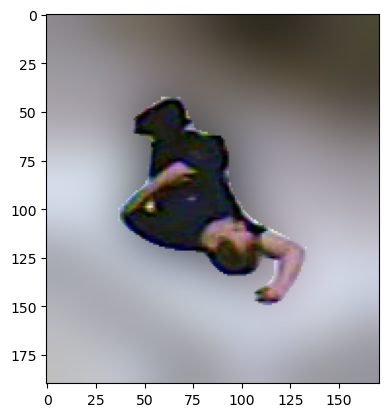


0: 448x640 1 person, 2 chairs, 1 bed, 1 teddy bear, 152.5ms
Speed: 0.9ms preprocess, 152.5ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x576 1 person, 239.0ms
Speed: 0.8ms preprocess, 239.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 576)


#### Frame Timestamp: 3766

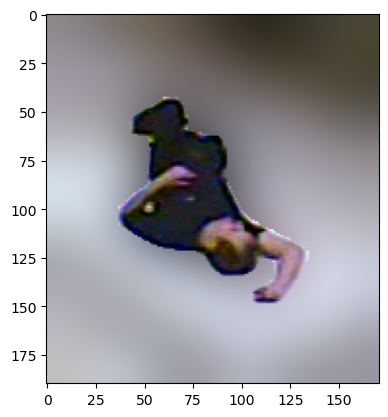


0: 448x640 1 person, 2 chairs, 1 bed, 1 tv, 1 teddy bear, 145.1ms
Speed: 0.9ms preprocess, 145.1ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 1 person, 1 laptop, 316.8ms
Speed: 0.9ms preprocess, 316.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3775

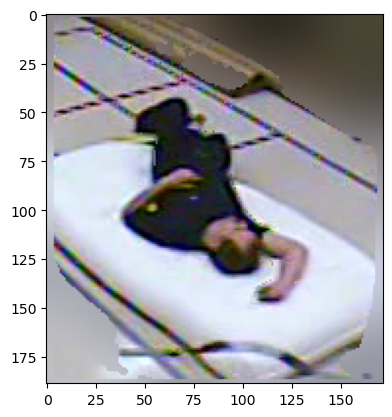


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 177.8ms
Speed: 0.9ms preprocess, 177.8ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 1 dog, 324.6ms
Speed: 1.1ms preprocess, 324.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3783

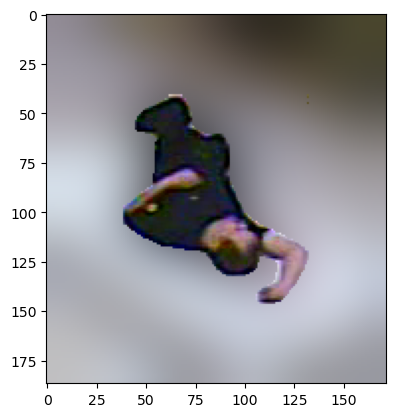


0: 448x640 1 person, 1 chair, 1 bed, 1 teddy bear, 257.3ms
Speed: 1.2ms preprocess, 257.3ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 1 person, 336.9ms
Speed: 1.4ms preprocess, 336.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3791

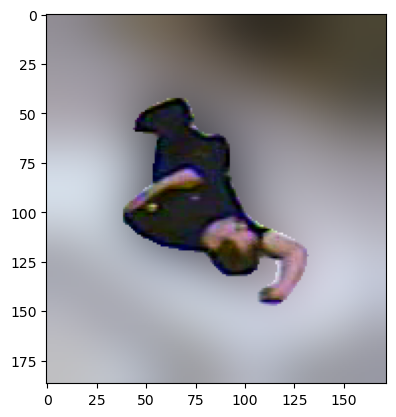


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 1 teddy bear, 149.5ms
Speed: 0.9ms preprocess, 149.5ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 1 dog, 1 laptop, 307.6ms
Speed: 0.9ms preprocess, 307.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3800

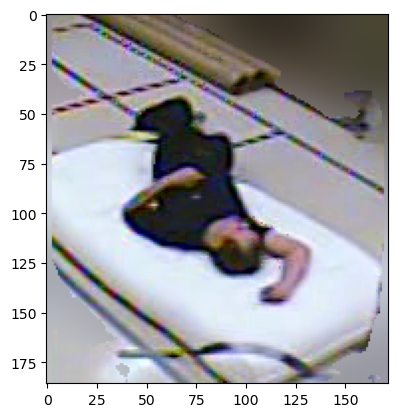


0: 448x640 1 person, 1 bed, 182.5ms
Speed: 1.0ms preprocess, 182.5ms inference, 0.7ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 1 person, 291.0ms
Speed: 0.8ms preprocess, 291.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3808

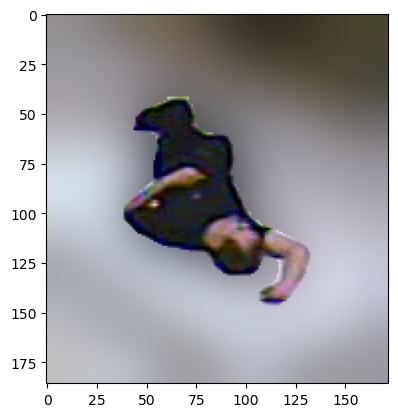


0: 448x640 1 person, 1 chair, 1 bed, 1 tv, 179.0ms
Speed: 1.0ms preprocess, 179.0ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 1 person, 1 dog, 1 laptop, 273.2ms
Speed: 1.0ms preprocess, 273.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3816

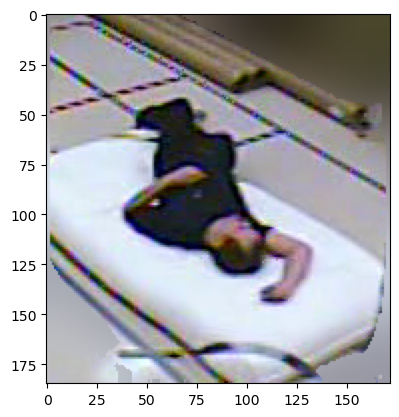


0: 448x640 1 person, 1 bed, 1 teddy bear, 142.0ms
Speed: 0.8ms preprocess, 142.0ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 640x608 1 cat, 1 dog, 1 laptop, 243.9ms
Speed: 1.0ms preprocess, 243.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 608)


#### Frame Timestamp: 3825

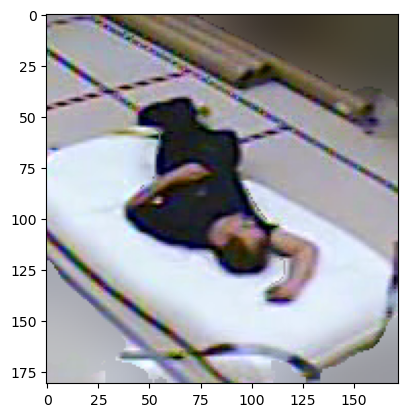

In [29]:
BaseOptions = mp.tasks.BaseOptions
PoseLandmarker = mp.tasks.vision.PoseLandmarker
PoseLandmarkerOptions = mp.tasks.vision.PoseLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

frame_width = 720
frame_height = 480

# Create a pose landmarker instance with the video mode:
options = PoseLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=model_path),
    running_mode=VisionRunningMode.VIDEO,
    num_poses=1,
    min_pose_detection_confidence=0.5,
    min_pose_presence_confidence=0.5,
    min_tracking_confidence=0.5,
    # output_pose_world_landmarks=True,
    # image_dimensions={"width": frame_width, "height": frame_height}
    )
with PoseLandmarker.create_from_options(options) as landmarker:
  # The landmarker is initialized. Use it here.
  # ...
  for i in range(len(dfSample)):
    row = dfSample.iloc[i]
    display(Markdown(f"### Fall" if row['label'] == 1.0 else "### No Fall"))
    frames = get_row_frames(row)

    prev_frame_timestamp_ms = 0
    for frame, frame_timestamp_ms in frames:
        if frame_timestamp_ms == prev_frame_timestamp_ms:
            continue
        prev_frame_timestamp_ms = frame_timestamp_ms
        people = get_people(frame)
        if len(people) > 0:
          person = people[0] # For this project, we only have one person in the frame
          # Convert the frame received from OpenCV to a MediaPipe’s Image object.
          processed_frame = process_frame(person)
          mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=processed_frame)
          # Perform pose landmarking on the provided single image.
          # The pose landmarker mus t be created with the video mode.
          # plt.imshow(cv2.cvtColor(mp_image, cv2.COLOR_RGB2BGR))
          # plt.show()
          display(Markdown(f"#### Frame Timestamp: {frame_timestamp_ms}"))
          pose_landmarker_result = landmarker.detect_for_video(mp_image, frame_timestamp_ms)
          # Visualize the pose landmarks on the image
          annotated_image = draw_landmarks_on_image(processed_frame, pose_landmarker_result)
          plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))
          plt.show()
        else:
          display(Markdown(f"#### No people detected"))
            
  

In [12]:
dfCamData = pd.read_csv(CAM_METADATA_PATH)
display(dfCamData.head())
dfSummary(dfCamData)

,camera,fx,fy,u0,v0,alphac,kc1,kc2,kc3,kc4,...,r13,r21,r22,r23,r31,r32,r33,Tx,Ty,Tz
0,1,471.326642,426.662204,346.657860,218.359329,0.0,-0.397822,0.131226,-0.001153,-0.002291,...,0.167711,0.517417,-0.331433,-0.788944,-0.491896,0.639217,-0.591135,-3.476486,-1.156084,4.845474
1,2,472.958996,428.846694,345.469798,248.497163,0.0,-0.389072,0.125992,0.001063,-0.000414,...,0.052153,0.154337,-0.590387,-0.792227,-0.116949,0.785281,-0.607994,-2.820810,0.921080,2.734747
2,3,467.134293,422.904173,332.870103,273.174249,0.0,-0.416837,0.159970,0.000809,-0.001559,...,-0.078550,-0.427348,-0.555315,-0.713442,0.343529,0.630204,-0.696298,-0.868917,1.426262,2.167801
3,4,467.401144,422.921095,370.510953,235.676259,0.0,-0.407890,0.150979,-0.000570,0.000484,...,-0.055674,-0.550960,0.071925,-0.831430,0.833260,-0.007727,-0.552830,0.014083,0.034027,4.514700
4,5,468.525718,424.278202,356.867078,260.554677,0.0,-0.413251,0.156961,-0.000471,0.000095,...,-0.001528,0.461070,0.037006,-0.886590,-0.883480,-0.074221,-0.462550,-0.837420,-0.255280,5.829700


No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,camera[int64],1. 12. 23. 34. 45. 56. 67. 78. 8,1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%),"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAC4CAYAAAD0WZ4UAAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjAsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvlHJYcgAAAAlwSFlzAAAPYQAAD2EBqD+naQAAAqJJREFUeJzt3EFq21AARdGvYkIzkTAGL8aL6GK7CO3GGGvQhEzcQYftLOIG3HMW8MngIiPxX6bH4zGg8O2r/wD+H2IjIzYyYiMjNjJiIzONMV7HGC87nffxeDzedjqLJ3M4nU4/5nk+7nHYtm23aZp+Co5/OczzfLxcLm/Lsrx/5qD7/f59Xdfj9Xp9GWOIjb8cxhhjWZb38/n8a4fzXnc4gyflBYGM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI3MYYw/14M+e9AeZ/DcDtu23dZ1PY4drgdt23YbY3x8/s/iGbkWTmby7xeoeLKRMXghY/BCxuCFjI+6ZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZAxeyBi8kHEtnIzBCxkvCGT8jJKxriJjXUXGuoqMFwQyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYy1lVkrKvIuBZOxrqKjCcbGYMXMgYvZAxeyPioS0ZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERsbghYzBCxnXwskYvJDxgkDGzygZ6yoy1lVkrKvIeEEgIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjY11FxrqKjGvhZKyryHiykTF4IWPwQsbghYyPumTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERsa6iox1FRkbBDLWVWQ82chYV5GxriJjXUXGR10yYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyBi9kDF7IuBZOxuCFjCcbGYMXMgYvZAxeyPioS0ZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZKyryFhXkbFBIGNdRcYLAhmxkREbGbGRERuZ3y2VroQVOKytAAAAAElFTkSuQmCC"">",0(0.0%)
2,fx[float64],1. 471.326642112614542. 472.95899556263823. 467.134293415803544. 467.401143838469865. 468.525718027105036. 464.80393206631017. 471.672767285177948. 470.5613164333817,1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%),"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAC4CAYAAAD0WZ4UAAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjAsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvlHJYcgAAAAlwSFlzAAAPYQAAD2EBqD+naQAAAqJJREFUeJzt3EFq21AARdGvYkIzkTAGL8aL6GK7CO3GGGvQhEzcQYftLOIG3HMW8MngIiPxX6bH4zGg8O2r/wD+H2IjIzYyYiMjNjJiIzONMV7HGC87nffxeDzedjqLJ3M4nU4/5nk+7nHYtm23aZp+Co5/OczzfLxcLm/Lsrx/5qD7/f59Xdfj9Xp9GWOIjb8cxhhjWZb38/n8a4fzXnc4gyflBYGM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI3MYYw/14M+e9AeZ/DcDtu23dZ1PY4drgdt23YbY3x8/s/iGbkWTmby7xeoeLKRMXghY/BCxuCFjI+6ZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZAxeyBi8kHEtnIzBCxkvCGT8jJKxriJjXUXGuoqMFwQyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYy1lVkrKvIuBZOxrqKjCcbGYMXMgYvZAxeyPioS0ZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERsbghYzBCxnXwskYvJDxgkDGzygZ6yoy1lVkrKvIeEEgIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjY11FxrqKjGvhZKyryHiykTF4IWPwQsbghYyPumTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERsa6iox1FRkbBDLWVWQ82chYV5GxriJjXUXGR10yYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyBi9kDF7IuBZOxuCFjCcbGYMXMgYvZAxeyPioS0ZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZKyryFhXkbFBIGNdRcYLAhmxkREbGbGRERuZ3y2VroQVOKytAAAAAElFTkSuQmCC"">",0(0.0%)
3,fy[float64],1. 426.662204436341942. 428.846694149710063. 422.90417251449464. 422.921094825239665. 424.27820173833216. 421.088099166200957. 426.98520717576358. 425.59457151370225,1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%)1 (12.5%),"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAC4CAYAAAD0WZ4UAAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjAsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvlHJYcgAAAAlwSFlzAAAPYQAAD2EBqD+naQAAAqJJREFUeJzt3EFq21AARdGvYkIzkTAGL8aL6GK7CO3GGGvQhEzcQYftLOIG3HMW8MngIiPxX6bH4zGg8O2r/wD+H2IjIzYyYiMjNjJiIzONMV7HGC87nffxeDzedjqLJ3M4nU4/5nk+7nHYtm23aZp+Co5/OczzfLxcLm/Lsrx/5qD7/f59Xdfj9Xp9GWOIjb8cxhhjWZb38/n8a4fzXnc4gyflBYGM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI3MYYw/14M+e9AeZ/DcDtu23dZ1PY4drgdt23YbY3x8/s/iGbkWTmby7xeoeLKRMXghY/BCxuCFjI+6ZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZAxeyBi8kHEtnIzBCxkvCGT8jJKxriJjXUXGuoqMFwQyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYy1lVkrKvIuBZOxrqKjCcbGYMXMgYvZAxeyPioS0ZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERsbghYzBCxnXwskYvJDxgkDGzygZ6yoy1lVkrKvIeEEgIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjY11FxrqKjGvhZKyryHiykTF4IWPwQsbghYyPumTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERsa6iox1FRkbBDLWVWQ82chYV5GxriJjXUXGR10yYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyBi9kDF7IuBZOxuCFjCcbGYMXMgYvZ

### Observations

* There are no null values
* `alphac` and `kc5` are zero for all cameras, so we can ignore that parameter
* The parameters vary widely and should be normalized before training

In [18]:
from sklearn.preprocessing import StandardScaler

dfCamDataNormalized = dfCamData.drop(columns=['alphac', 'kc5'])

# Normalize all columns except 'camera' using StandardScaler
scaler = StandardScaler()
# Separate camera column
camera_col = dfCamDataNormalized['camera']
# Get other columns to normalize
cols_to_normalize = [col for col in dfCamDataNormalized.columns if col != 'camera']

# Normalize the selected columns
normalized_data = scaler.fit_transform(dfCamDataNormalized[cols_to_normalize])

# Create one-hot encoded camera columns first
camera_columns = {}
for cam_num in range(1, 9):  # Cameras 1-8
    camera_columns[f'camera_{cam_num}'] = (camera_col == cam_num).astype(int)

# Create new dataframe with camera columns first, then the rest of the normalized data
dfCamDataNormalized = pd.DataFrame(camera_columns)
dfCamDataNormalized = pd.concat([
    dfCamDataNormalized,
    pd.DataFrame(normalized_data, columns=cols_to_normalize)
], axis=1)

# Display first few rows and summary statistics of normalized data
display(dfCamDataNormalized.head())
dfSummary(dfCamDataNormalized)

dfCamDataNormalized.to_csv(CAM_METADATA_PATH_NORMALIZED, index=False)

,camera_1,camera_2,camera_3,camera_4,camera_5,camera_6,camera_7,camera_8,fx,fy,...,r13,r21,r22,r23,r31,r32,r33,Tx,Ty,Tz
0,1,0,0,0,0,0,0,0,0.782043,0.728115,...,1.851124,1.252353,-0.802866,0.029465,-0.830322,1.093021,0.275641,-1.502853,-0.988999,0.435112
1,0,1,0,0,0,0,0,0,1.411348,1.635879,...,0.453486,0.361679,-1.357893,-0.037568,-0.145583,1.351387,0.043041,-1.215107,0.999040,-1.094422
2,0,0,1,0,0,0,0,0,-0.834191,-0.833533,...,-1.127306,-1.065253,-1.282722,1.570995,0.695355,1.077078,-1.175288,-0.358510,1.482546,-1.505258
3,0,0,0,1,0,0,0,0,-0.731315,-0.826501,...,-0.850634,-1.368487,0.061667,-0.837976,1.589716,-0.051326,0.804132,0.028998,0.150047,0.195417
4,0,0,0,0,1,0,0,0,-0.297769,-0.262556,...,-0.195755,1.114129,-0.013177,-1.964183,-1.545445,-0.168944,2.049723,-0.344687,-0.126846,1.148329
